In [1]:
import sys
import os
import struct
import time
import numpy as np
import gc
import h5py
from scipy.io import loadmat
from scipy.stats import pearsonr
from tqdm import tqdm
import pickle
import math
import matplotlib.pyplot as plt
from matplotlib import cm
import seaborn as sns
%matplotlib inline

fpX = np.float32

import torch 
sys.path.append('/user_data/mmhender/imStat/fwrf_code_from_osf/')
import src.numpy_utility as pnu
from src.file_utility import save_stuff, flatten_dict, embed_dict
from src.gabor_feature_extractor import Gaborizer
from src.torch_fwrf import learn_params_ridge_regression, get_predictions, get_value, set_value, Torch_fwRF_voxel_block, get_r2, add_nonlinearity, get_features_in_prf, get_fmaps_sizes
from src.rf_grid import linspace, logspace
import src.numpy_utility as pnu
from src.file_utility import save_stuff, flatten_dict, embed_dict
from src.load_nsd import image_uncolorize_fn


In [2]:
import torch
# device = torch.device('cpu:0')
print ('#device:', torch.cuda.device_count())
print ('device#:', torch.cuda.current_device())
print ('device name:', torch.cuda.get_device_name(torch.cuda.current_device()))

torch.manual_seed(time.time())
device = torch.device("cuda:0") #cuda
torch.backends.cudnn.enabled=True

print ('\ntorch:', torch.__version__)
print ('cuda: ', torch.version.cuda)
print ('cudnn:', torch.backends.cudnn.version())
print ('dtype:', torch.get_default_dtype())
#torch.set_default_dtype(torch.float64)

#device: 1
device#: 0
device name: GeForce RTX 2080 Ti

torch: 1.8.1+cu111
cuda:  11.1
cudnn: 8005
dtype: torch.float32


In [3]:
# Setting up the feature extractor w gabor filter bank

from src.torch_fwrf import get_value, set_value, _to_torch
from src.gabor_feature_extractor import Gaborizer
from src.rf_grid import linspace, logspace

class add_nonlinearity(torch.nn.Module):
    def __init__(self, _fmaps_fn, _nonlinearity):
        super(add_nonlinearity, self).__init__()
        self.fmaps_fn = _fmaps_fn
        self.nl_fn = _nonlinearity
    def forward(self, _x):
        return [self.nl_fn(_fm) for _fm in self.fmaps_fn(_x)]

padding_mode = 'circular'
    
n_ori = 36
# n_ori = 6
n_sf = 12
# cyc_per_stim = logspace(12)(3., 72.) # 6-92
cyc_per_stim = logspace(n_sf)(3., 72.)
pix_per_cycle = 4.13   # this changes the actual size of filters in pixels, might help with orientation resolution?
# pix_per_cycle = 6

_gaborizer = Gaborizer(num_orientations=n_ori, cycles_per_stim=cyc_per_stim,
          pix_per_cycle=pix_per_cycle, cycles_per_radius=.7, 
          radii_per_filter=4, complex_cell=True, pad_type='half', padding_mode = padding_mode, 
          crop=False).to(device)

_fmaps_fn = _gaborizer
# _fmaps_fn = add_nonlinearity(_gaborizer, lambda x: torch.log(1+torch.sqrt(x)))

# pull out some relevant stuff from gaborizer object to save
sf_tuning_masks = _gaborizer.sf_tuning_masks
assert(np.all(_gaborizer.cyc_per_stim==cyc_per_stim))

ori_tuning_masks = _gaborizer.ori_tuning_masks
orients_deg = _gaborizer.orients_deg
orient_filters = _gaborizer.orient_filters    


In [4]:
# Creating fake images (slow)

from src.load_nsd import image_uncolorize_fn
from src.file_utility import load_mask_from_nii, view_data
from src.load_nsd import image_uncolorize_fn, data_split, load_betas
from src.roi import roi_map, iterate_roi

n_images = 1000
image_data = (np.random.normal(0,1,[n_images, 3, 227, 227])*30+255/2).astype(np.uint8)
image_data = np.maximum(np.minimum(image_data, 255),0)

print ('image data size:', image_data.shape, ', dtype:', image_data.dtype, ', value range:',\
    np.min(image_data[0]), np.max(image_data[0]))

random_images = image_uncolorize_fn(image_data)

image data size: (1000, 3, 227, 227) , dtype: uint8 , value range: 1 252


Text(0.5, 0.98, 'random gaussian noise images')

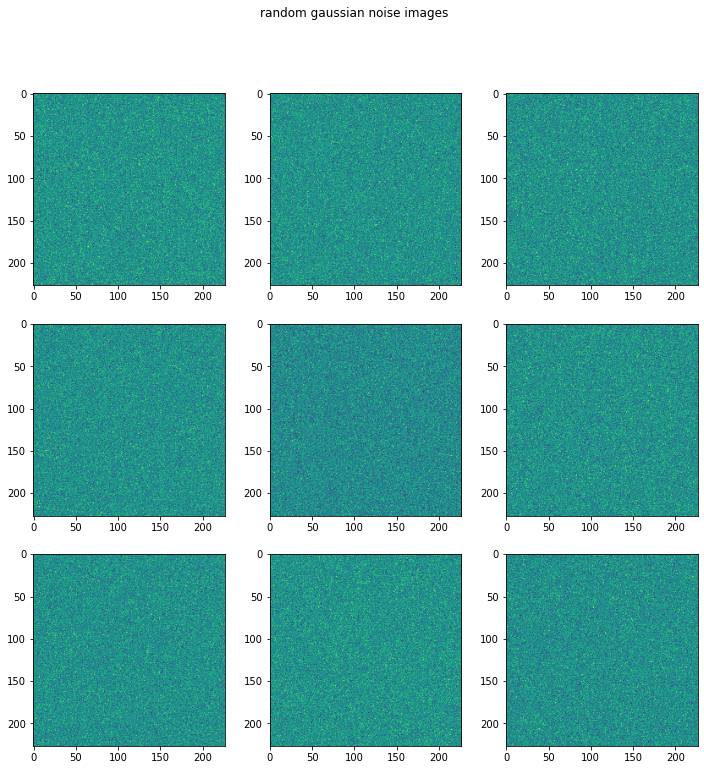

In [5]:
plt.figure(figsize=(12,12))
for ii in range(9):
    plt.subplot(3,3,ii+1);
    plt.imshow(random_images[ii,0,:,:])
    
plt.suptitle('random gaussian noise images')

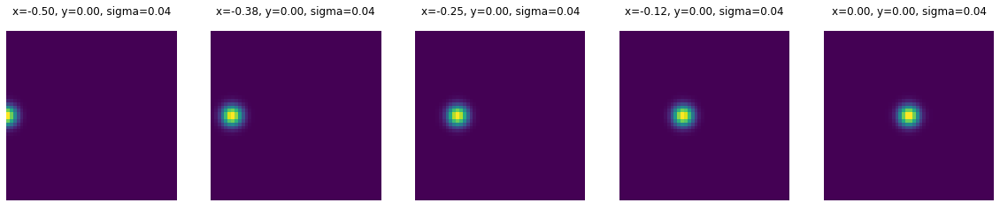

In [7]:
# define spatial RF region to use

# note get diff results for diff regions of space.

n_prfs = 5
xvals = np.linspace(-0.5, 0, 5)
yvals = 0*np.ones(np.shape(xvals))
sigmavals = 0.04*np.ones(np.shape(xvals))

from src.numpy_utility import make_gaussian_mass_stack

g = make_gaussian_mass_stack(xvals,yvals,sigmavals, n_pix=50, size=1.0, dtype=np.float32)
plt.figure(figsize=(20,4))
for mm in range(n_prfs):
    plt.subplot(1,5,mm+1)
    plt.pcolormesh(g[2][mm])
    plt.axis('equal')
    plt.axis('off')
    plt.title('x=%.2f, y=%.2f, sigma=%.2f'%(xvals[mm],yvals[mm],sigmavals[mm]))

In [9]:
# Get features for the desired pRF, across all trn set image 
sample_batch_size=50
n_features, fmaps_rez = get_fmaps_sizes(_fmaps_fn, torch.tensor(random_images[0:sample_batch_size]).to(device), device)

random_features_each_model = np.zeros((n_images, n_features, n_prfs))
for mm in range(n_prfs):
    random_features = get_features_in_prf((xvals[mm],yvals[mm],sigmavals[mm]), _fmaps_fn, random_images, sample_batch_size, aperture=1.0, device=device)
    random_features_each_model[:,:,mm] = random_features


/user_data/mmhender/imStat/fwrf_code_from_osf/src/torch_fwrf.py:163: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  _x = torch.tensor(image_batch).to(device) # the input variable.
/home/mmhender/myenv/lib/python3.7/site-packages/torch/nn/functional.py:3458: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)


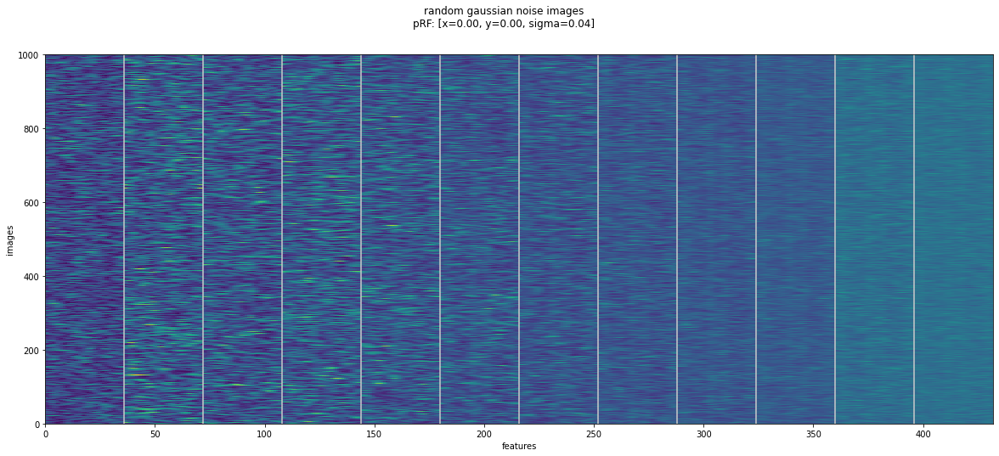

In [11]:
# visualizing ntrials x nfeatures (no z-score)

mm=4

plt.figure(figsize=(20,8));
plt.pcolormesh(random_features_each_model[:,:,mm])
plt.suptitle('random gaussian noise images\npRF: [x=%.2f, y=%.2f, sigma=%.2f]'%(xvals[mm],yvals[mm],sigmavals[mm]))
plt.xlabel('features')
plt.ylabel('images')
for ii in np.arange(0,432,36):
    plt.axvline(ii,color=[0.8, 0.8, 0.8])
   

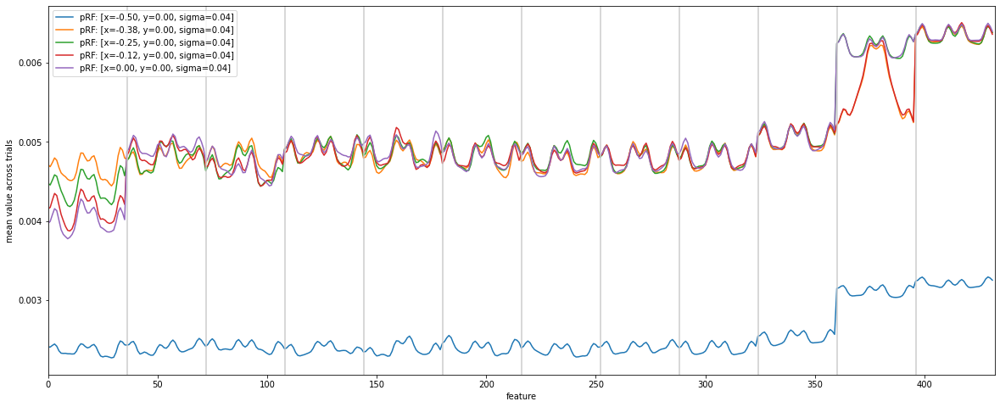

In [12]:
plt.figure(figsize=(20,8));

for mm in range(n_prfs):
    plt.plot(np.mean(random_features_each_model[:,:,mm],axis=0))
    
for ii in np.arange(0,432,36):
    plt.axvline(ii,color=[0.8, 0.8, 0.8])
    
plt.xlim([0,432])
plt.xlabel('feature')
plt.ylabel('mean value across trials')

plt.legend(['pRF: [x=%.2f, y=%.2f, sigma=%.2f]'%(xvals[mm],yvals[mm],sigmavals[mm]) for mm in range(n_prfs)])

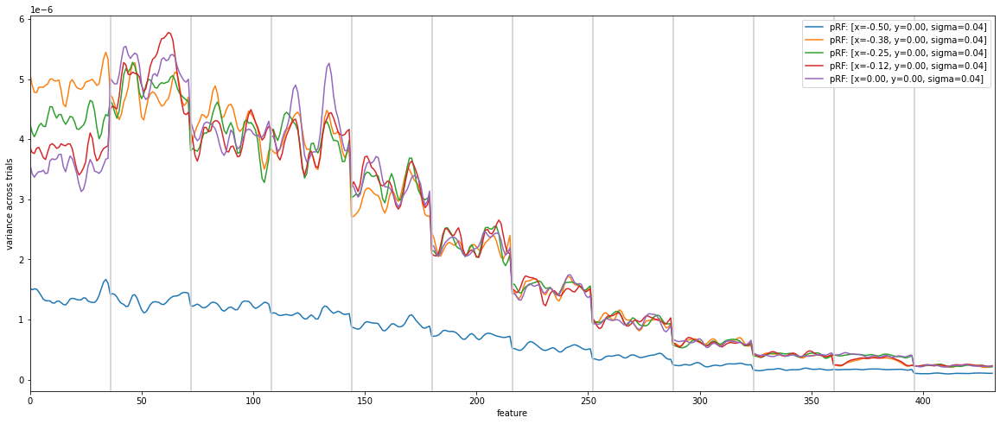

In [13]:
plt.figure(figsize=(20,8));

for mm in range(n_prfs):
    plt.plot(np.var(random_features_each_model[:,:,mm],axis=0))
    
for ii in np.arange(0,432,36):
    plt.axvline(ii,color=[0.8, 0.8, 0.8])
    
plt.xlim([0,432])
plt.xlabel('feature')
plt.ylabel('variance across trials')

plt.legend(['pRF: [x=%.2f, y=%.2f, sigma=%.2f]'%(xvals[mm],yvals[mm],sigmavals[mm]) for mm in range(n_prfs)])

Text(0.5, 0.98, 'random gaussian noise images')

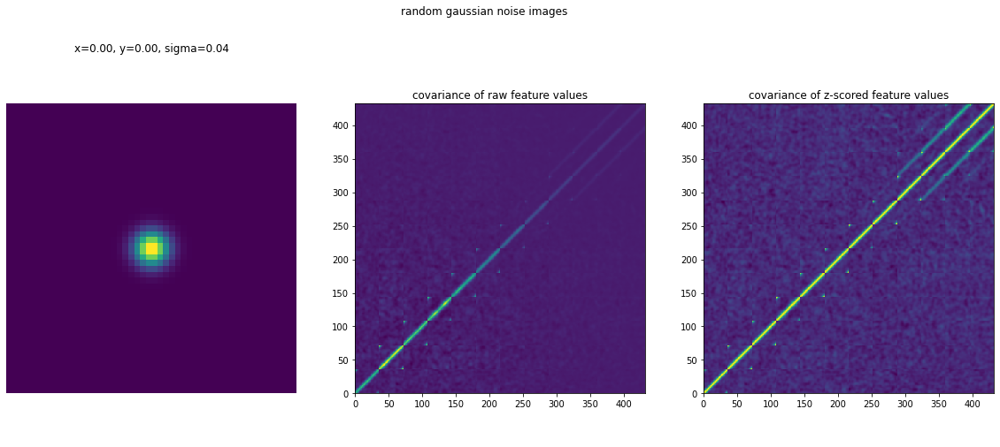

In [16]:
# visualizing covariance among features in the training set data - before and after z-scoring
# all features are nori*nsf = 432 total
import scipy

mm=4


plt.figure(figsize=(20,8));

plt.subplot(1,3,1)
plt.pcolormesh(g[2][mm])
plt.axis('equal')
plt.axis('off')
plt.title('x=%.2f, y=%.2f, sigma=%.2f'%(xvals[mm],yvals[mm],sigmavals[mm]))
    
plt.subplot(1,3,2)
covariance_trn = np.cov(np.transpose(random_features_each_model[:,:,mm]))
plt.pcolormesh(covariance_trn)
# plt.colorbar()
plt.axis('square')
plt.title('covariance of raw feature values')

plt.subplot(1,3,3)
featz = scipy.stats.zscore(random_features_each_model[:,:,mm],axis=0)
covariance_trn = np.cov(np.transpose(featz))
plt.pcolormesh(covariance_trn)
# plt.colorbar()
plt.axis('square')
plt.title('covariance of z-scored feature values')

plt.suptitle('random gaussian noise images')

Text(0.5, 0.98, 'random gaussian noise images\nx=-0.50, y=0.00, sigma=0.04s')

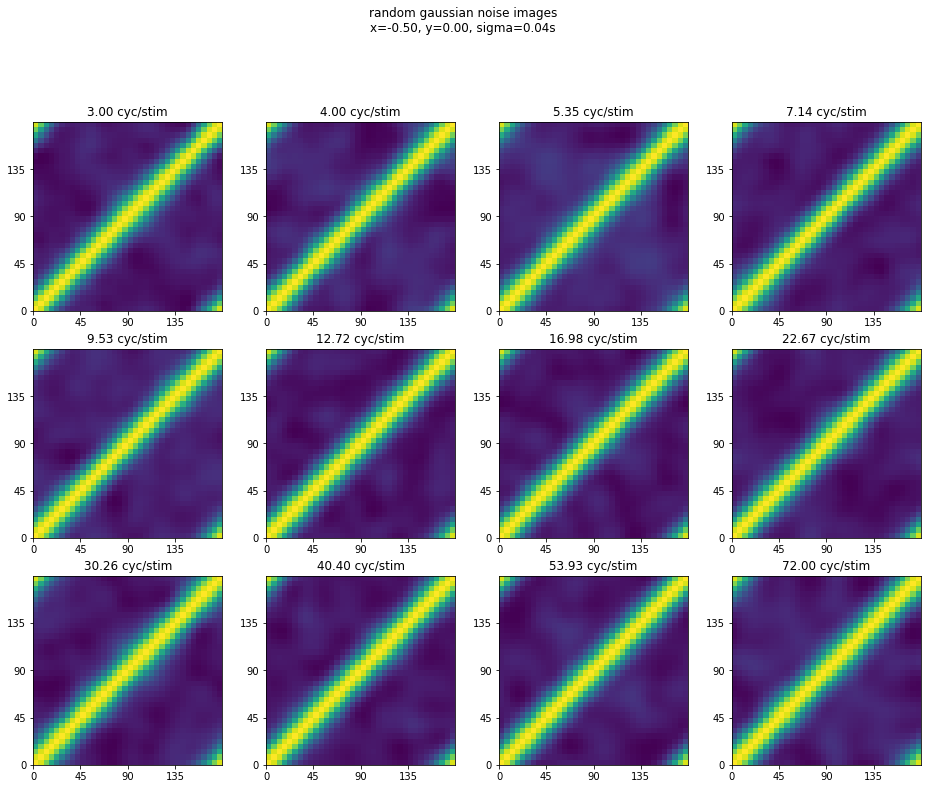

In [18]:
# visualizing just one SF at a time...

mm=0
plt.figure(figsize=(16,16));

for sf2plot in range(n_sf):

    covar = np.cov(np.transpose(scipy.stats.zscore(random_features_each_model[:,sf_tuning_masks[sf2plot],mm], axis=0)))

    plt.subplot(4,4,sf2plot+1)
    plt.pcolormesh(covar)
#     plt.colorbar()
#     plt.clim([0, 0.1])
    plt.axis('square')
    plt.xticks(np.arange(0,35,9),labels=np.arange(0,179,45))
    plt.yticks(np.arange(0,35,9),labels=np.arange(0,179,45))
    plt.title('%.2f cyc/stim'%(cyc_per_stim[sf2plot]))
    
plt.suptitle('random gaussian noise images\nx=%.2f, y=%.2f, sigma=%.2fs'%(xvals[mm],yvals[mm],sigmavals[mm]))


0.02905523


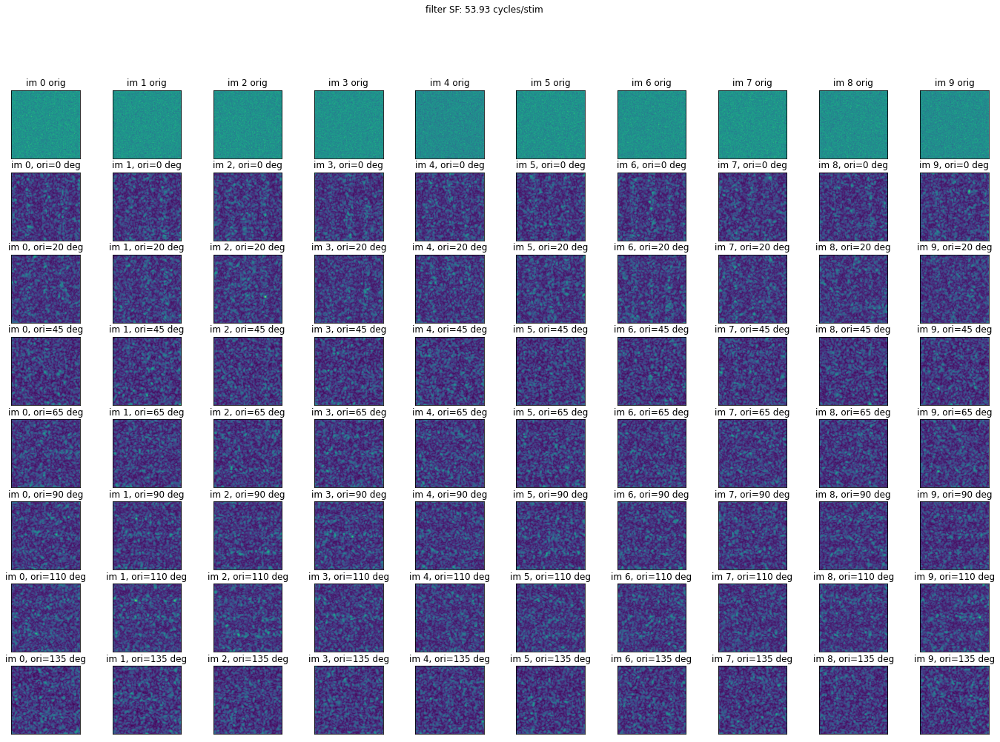

In [20]:
# visualize some of the actual feature maps

ims2plot=range(10)
maps = _fmaps_fn(_to_torch(random_images[ims2plot],device=device))
maps = [maps[sf].detach().cpu().numpy() for sf in range(len(maps))]

sf = 10
ori2plot = [0,4,9,13,18,22,27]
# ori2plot = np.arange(0,36,3)
# ori2plot = np.arange(6,13,1)
plt.figure(figsize=(24,16));
pi=0
ymax=0
clim_plot = 0.032

for ii, im in enumerate(ims2plot):
    pi=pi+1
    plt.subplot(len(ori2plot)+1, len(ims2plot), pi);
    plt.imshow(random_images[im,0,:,:])
    plt.xticks([]); plt.yticks([])
    plt.title('im %d orig'%(im))
    
for oo, ori in enumerate(ori2plot):
    for ii, im in enumerate(ims2plot):
        pi=pi+1
        plt.subplot(len(ori2plot)+1, len(ims2plot), pi);
        thismap=maps[sf][ii,ori,:,:]
        assert(np.max(thismap)<clim_plot)
        ymax = max(ymax, np.max(thismap))
        plt.imshow(thismap)
        plt.xticks([]); plt.yticks([])
        plt.title('im %d, ori=%d deg'%(im, orients_deg[ori]))
        plt.clim([0,clim_plot])

plt.suptitle('filter SF: %.2f cycles/stim'%cyc_per_stim[sf])

print(ymax)

In [109]:
# Loading a set of actual images

nsd_root = "/lab_data/tarrlab/common/datasets/NSD/"
stim_root = '/user_data/mmhender/nsd_stimuli/stimuli/nsd/'
subject = 1
saveext = ".png"
savearg = {'format':'png', 'dpi': 120, 'facecolor': None}
exp_design_file = nsd_root + "nsddata/experiments/nsd/nsd_expdesign.mat"

# Loading images to do some more testing...
exp_design = loadmat(exp_design_file)
ordering = exp_design['masterordering'].flatten() - 1 # zero-indexed ordering of indices (matlab-like to python-like)

image_data = {}
image_data_set = h5py.File(stim_root + "S%d_stimuli_227.h5py"%subject, 'r')
image_data = np.copy(image_data_set['stimuli'])
image_data_set.close()
print ('block size:', image_data.shape, ', dtype:', image_data.dtype, ', value range:',\
    np.min(image_data[0]), np.max(image_data[0]))

from src.load_nsd import image_uncolorize_fn

images = image_uncolorize_fn(image_data[0:5000,:,:,:])
np.shape(images)

block size: (10000, 3, 227, 227) , dtype: uint8 , value range: 0 255


(5000, 1, 227, 227)

In [9]:
np.mean(images)

0.4566951

Text(0.5, 0.98, 'sample of NSD images')

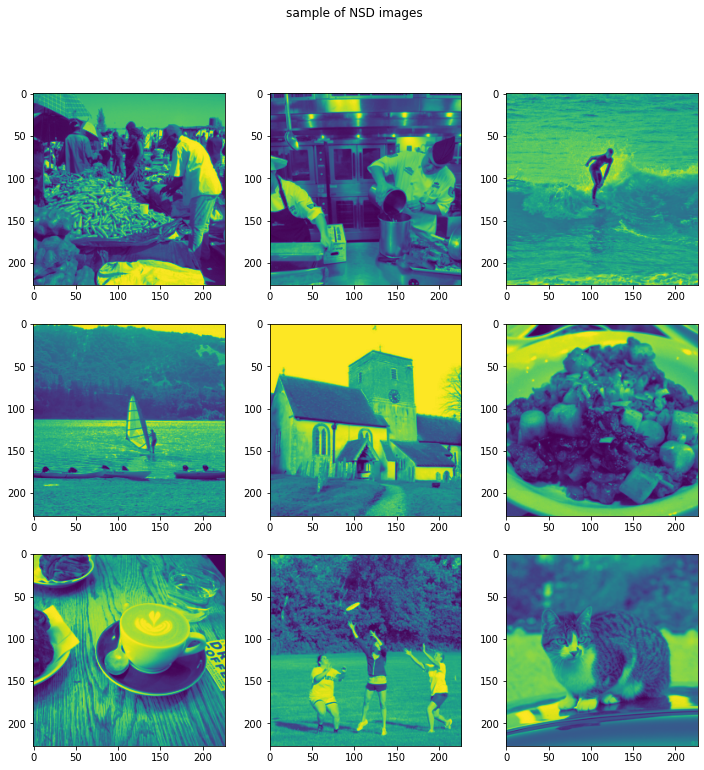

In [137]:
plt.figure(figsize=(12,12))
for ii in range(9):
    plt.subplot(3,3,ii+1);
    plt.imshow(images[ii,0,:,:])
    
plt.suptitle('sample of NSD images')

In [113]:
# Get features for the desired pRF, across all trn set image 
sample_batch_size=50
n_features, fmaps_rez = get_fmaps_sizes(_fmaps_fn, torch.tensor(images[0:sample_batch_size]).to(device), device)
n_images = np.shape(images)[0]
features_each_model = np.zeros((n_images, n_features, n_prfs))
for mm in range(n_prfs):
    features = get_features_in_prf((xvals[mm],yvals[mm],sigmavals[mm]), _fmaps_fn, images, sample_batch_size, aperture=1.0, device=device)
    features_each_model[:,:,mm] = features


Text(0.5, 0.98, 'NSD images')

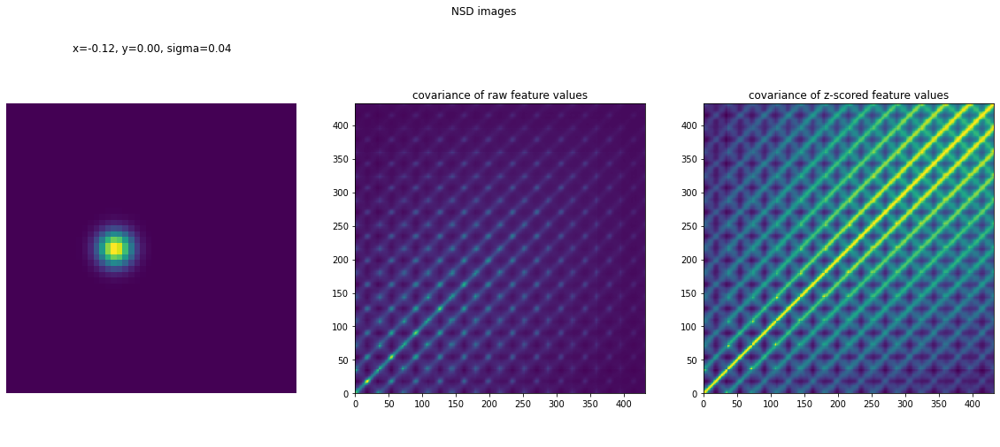

In [138]:
# visualizing covariance among features in the training set data - before and after z-scoring
# all features are nori*nsf = 432 total
import scipy

mm=3

plt.figure(figsize=(20,8));

plt.subplot(1,3,1)
plt.pcolormesh(g[2][mm])
plt.axis('equal')
plt.axis('off')
plt.title('x=%.2f, y=%.2f, sigma=%.2f'%(xvals[mm],yvals[mm],sigmavals[mm]))
    
plt.subplot(1,3,2)
covariance_trn = np.cov(np.transpose(features_each_model[:,:,mm]))
plt.pcolormesh(covariance_trn)
# plt.colorbar()
plt.axis('square')
plt.title('covariance of raw feature values')

plt.subplot(1,3,3)
featz = scipy.stats.zscore(features_each_model[:,:,mm],axis=0)
covariance_trn = np.cov(np.transpose(featz))
plt.pcolormesh(covariance_trn)
# plt.colorbar()
plt.axis('square')
plt.title('covariance of z-scored feature values')

plt.suptitle('NSD images')

Text(0.5, 0.98, 'NSD images\nx=-0.50, y=0.00, sigma=0.04s')

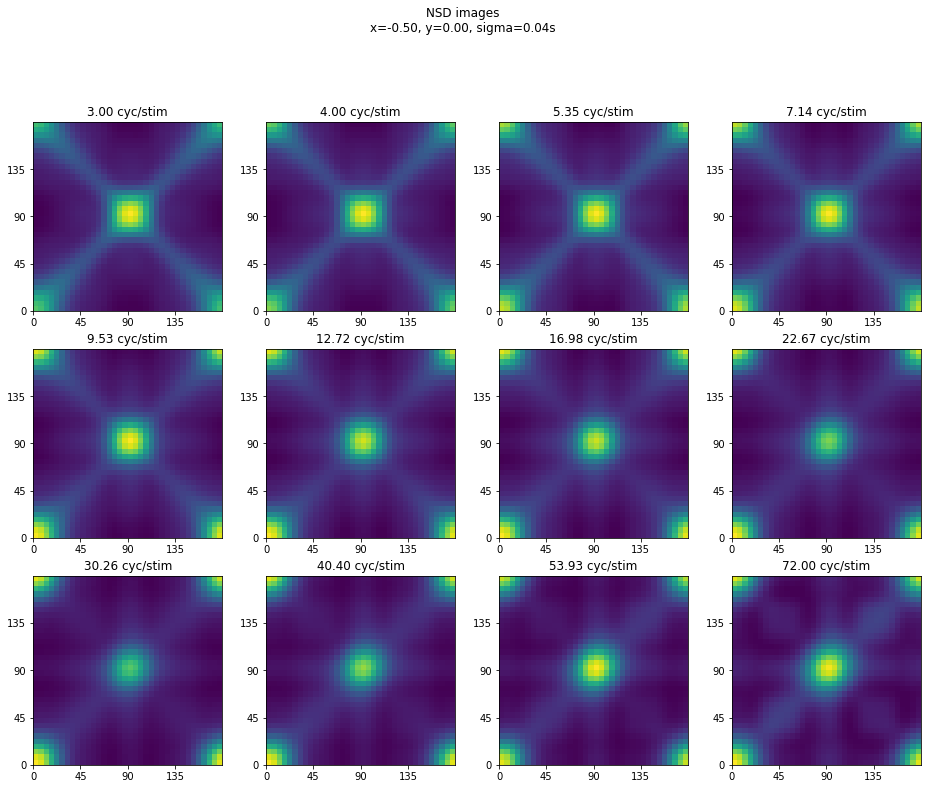

In [156]:
# visualizing just one SF at a time...

mm=0
plt.figure(figsize=(16,16));

for sf2plot in range(n_sf):

#     covar = np.cov(np.transpose(scipy.stats.zscore(features_each_model[:,sf_tuning_masks[sf2plot],mm], axis=0)))
    covar = np.cov(np.transpose(features_each_model[:,sf_tuning_masks[sf2plot],mm]))

    plt.subplot(4,4,sf2plot+1)
    plt.pcolormesh(covar)
#     plt.colorbar()
#     plt.clim([0, 0.1])
    plt.axis('square')
    plt.xticks(np.arange(0,35,9),labels=np.arange(0,179,45))
    plt.yticks(np.arange(0,35,9),labels=np.arange(0,179,45))
    plt.title('%.2f cyc/stim'%(cyc_per_stim[sf2plot]))
    
plt.suptitle('NSD images\nx=%.2f, y=%.2f, sigma=%.2fs'%(xvals[mm],yvals[mm],sigmavals[mm]))


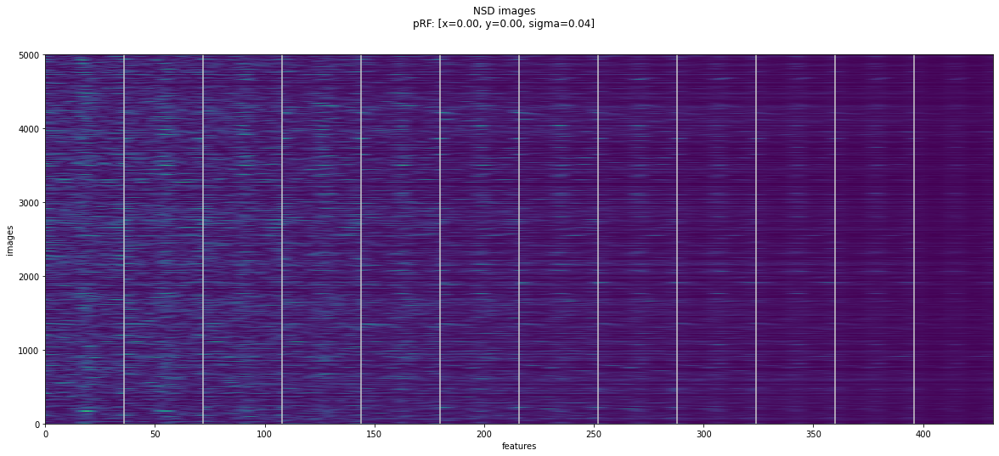

In [142]:
# visualizing ntrials x nfeatures (no z-score)

mm=4

plt.figure(figsize=(20,8));
plt.pcolormesh(features_each_model[:,:,mm])
plt.suptitle('NSD images\npRF: [x=%.2f, y=%.2f, sigma=%.2f]'%(xvals[mm],yvals[mm],sigmavals[mm]))
plt.xlabel('features')
plt.ylabel('images')
for ii in np.arange(0,432,36):
    plt.axvline(ii,color=[0.8, 0.8, 0.8])
   

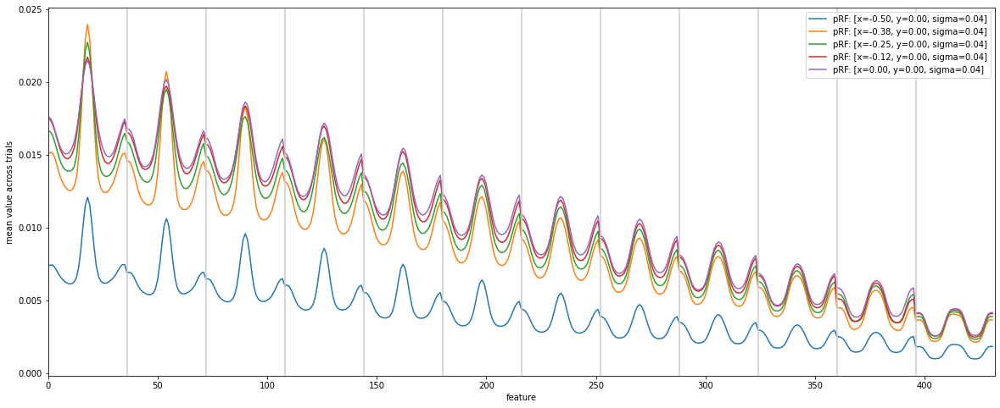

In [157]:
plt.figure(figsize=(20,8));

for mm in range(n_prfs):
    plt.plot(np.mean(features_each_model[:,:,mm],axis=0))
    
for ii in np.arange(0,432,36):
    plt.axvline(ii,color=[0.8, 0.8, 0.8])
    
plt.xlim([0,432])
plt.xlabel('feature')
plt.ylabel('mean value across trials')

plt.legend(['pRF: [x=%.2f, y=%.2f, sigma=%.2f]'%(xvals[mm],yvals[mm],sigmavals[mm]) for mm in range(n_prfs)])

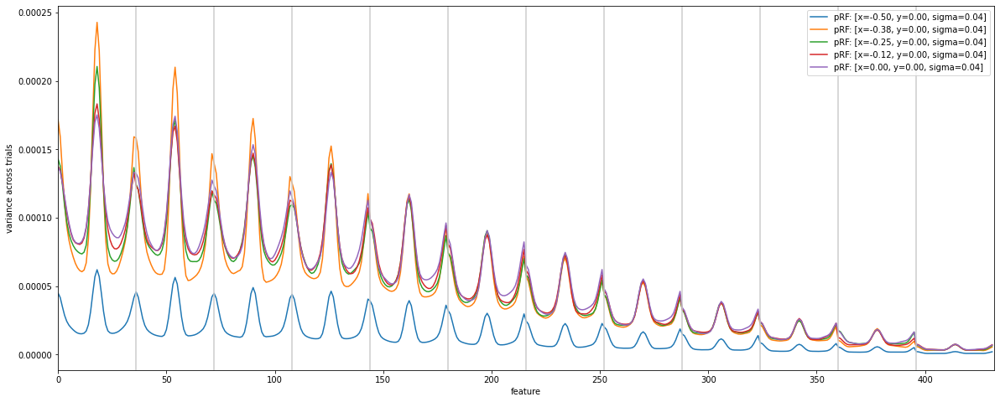

In [158]:
plt.figure(figsize=(20,8));

for mm in range(n_prfs):
    plt.plot(np.var(features_each_model[:,:,mm],axis=0))
    
for ii in np.arange(0,432,36):
    plt.axvline(ii,color=[0.8, 0.8, 0.8])
    
plt.xlim([0,432])
plt.xlabel('feature')
plt.ylabel('variance across trials')

plt.legend(['pRF: [x=%.2f, y=%.2f, sigma=%.2f]'%(xvals[mm],yvals[mm],sigmavals[mm]) for mm in range(n_prfs)])

/home/mmhender/myenv/lib/python3.7/site-packages/torch/nn/functional.py:3458: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)


0.083088025


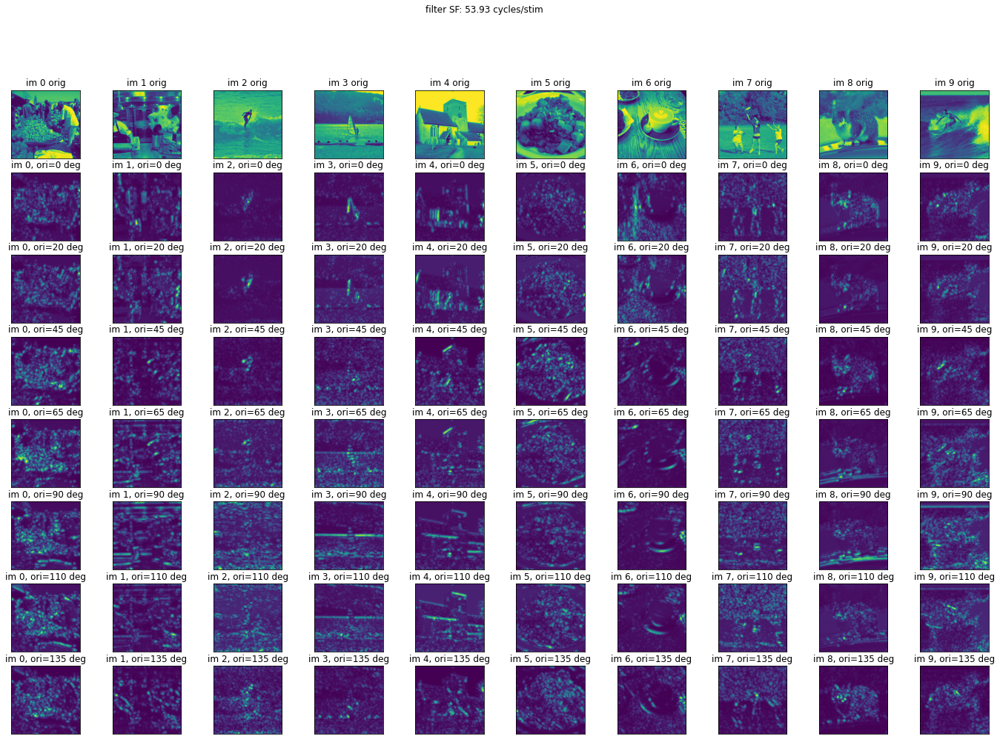

In [162]:
# visualize some of the actual feature maps

ims2plot=range(10)
maps = _fmaps_fn(_to_torch(images[ims2plot],device=device))
maps = [maps[sf].detach().cpu().numpy() for sf in range(len(maps))]

sf = 10
ori2plot = [0,4,9,13,18,22,27]
# ori2plot = np.arange(0,36,3)
# ori2plot = np.arange(6,13,1)
plt.figure(figsize=(24,16));
pi=0
ymax=0
for ii, im in enumerate(ims2plot):
    pi=pi+1
    plt.subplot(len(ori2plot)+1, len(ims2plot), pi);
    plt.imshow(images[im,0,:,:])
    plt.xticks([]); plt.yticks([])
    plt.title('im %d orig'%(im))
    
for oo, ori in enumerate(ori2plot):
    for ii, im in enumerate(ims2plot):
        pi=pi+1
        plt.subplot(len(ori2plot)+1, len(ims2plot), pi);
        thismap=maps[sf][ii,ori,:,:]
        assert(np.max(thismap)<0.25)
        ymax = max(ymax, np.max(thismap))
        plt.imshow(thismap)
        plt.xticks([]); plt.yticks([])
        plt.title('im %d, ori=%d deg'%(im, orients_deg[ori]))
#         plt.clim([0,0.25])

plt.suptitle('filter SF: %.2f cycles/stim'%cyc_per_stim[sf])

print(ymax)

[45, 63]
[4808 3851  467 1104 2257  457 3175 1797 2459 1954 2702 1659  775 2741
 3714 2546 3608 2113 1415 4116 4531  717 2944  909 2091 1617 1330 1098
 4349 1354 4640 1231  321 1316 4676 2862 2492 4547 1851 4254  418 4240
  455 3538 4657 1200 2377 2975 1198 2124]
[4808 3851 3608 2257 1231  457 2091 1797 4254  775  909 1354 3175 2862
 4640 2113 4547 1104 1200 4116 3538 2459 2546 1330 2492 1415  455 4240
 4349  717 2944 3714 2702 1316  467 1954  321 4531 2124 1617 1659 2741
 1098 2377 4657 1851 1198 4676 2975  418]


Text(0, 0.5, 'activation in this example image')

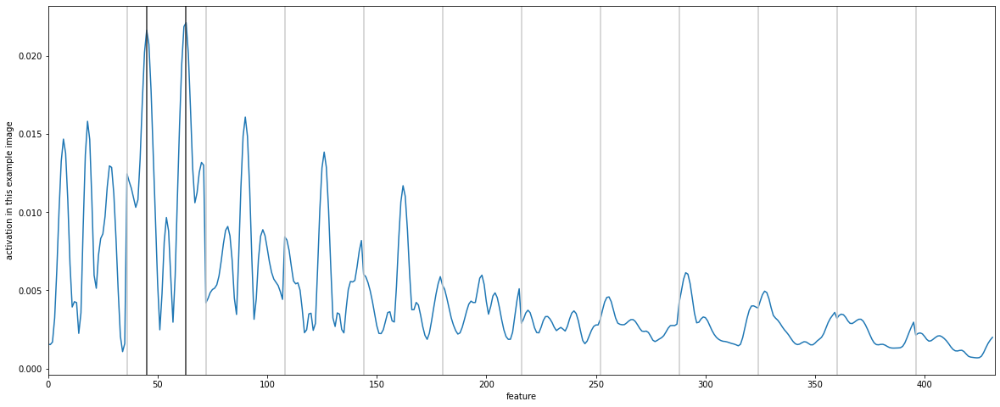

In [146]:
# find an image w high 45 and 135 energy in the RF region

mm = 0

features = features_each_model[:,:,mm]

feat_z = scipy.stats.zscore(features, axis=1)
ori1 = int(45/5)
ori2 = int(135/5)
sf2use = 1
ind1 = np.where(np.logical_and(sf_tuning_masks[sf2use], ori_tuning_masks[ori1]))[0][0]
ind2 = np.where(np.logical_and(sf_tuning_masks[sf2use], ori_tuning_masks[ori2]))[0][0]
print([ind1,ind2])

# best_ind1 = np.argsort(feat_z[:,ind1])[0:50]
# best_ind2 = best_ind1[np.argsort(feat_z[best_ind1,ind2])]
best_ind1 = np.argsort(-feat_z[:,ind1])[0:50]
best_ind2 = best_ind1[np.argsort(-feat_z[best_ind1,ind2])]
print(best_ind1)
print(best_ind2)

im2use = best_ind2[0]

plt.figure(figsize=(20,8));

image_feats = features[im2use,:]

plt.plot(np.transpose(image_feats))
# plt.plot(weights_from_val*np.sqrt(vfeat)+mfeat)
for ii in np.arange(0,432,36):
    plt.axvline(ii,color=[0.8, 0.8, 0.8])
    
plt.axvline(ind1,color=[0.2, 0.2, 0.2])
plt.axvline(ind2,color=[0.2, 0.2, 0.2])

plt.xlim([0,432])
plt.xlabel('feature')
plt.ylabel('activation in this example image')

In [147]:
np.shape(images[im2use])

(1, 227, 227)

[0.07085341, 0.00039038042]


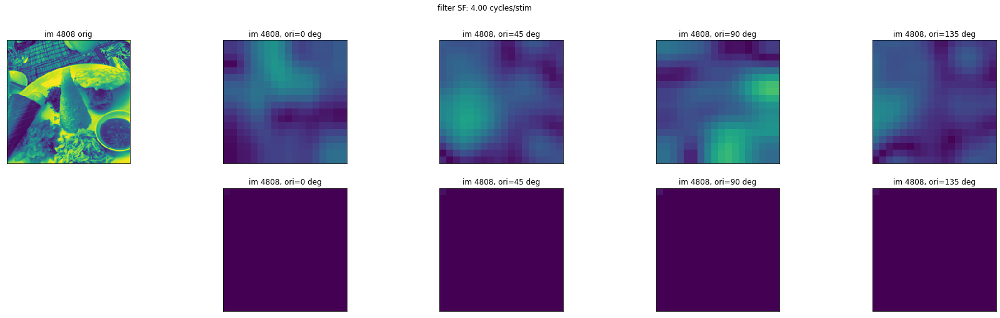

In [149]:
# visualize the actual feature maps

# zooming in on this little patch of background to see why higher for 0 and 90 channels...
# region2plot = np.array([100,124])
region2plot = np.array([0,224])

maps = _fmaps_fn(_to_torch(images[[im2use],:,:,:],device=device))
maps = [maps[sf].detach().cpu().numpy() for sf in range(len(maps))]

sf = 1
ori2plot = [0,9,18,27]

region2plot_adj = region2plot*np.shape(maps[sf])[2]/224

plt.figure(figsize=(30,8));
ymax=0
ymax2=0
ymaxplot = 0.1
ymaxplot2 = 0.007

plt.subplot(2, len(ori2plot)+1, 1);
im2plot=images[im2use,0,region2plot[0]:region2plot[1],:]
plt.pcolormesh(im2plot[:,region2plot[0]:region2plot[1]])
# plt.imshow(im2plot[:,region2plot[0]:region2plot[1]])
plt.axis('square')
plt.gca().invert_yaxis()
# plt.xlim(region2plot);plt.ylim(region2plot)
plt.xticks([]); plt.yticks([])
plt.title('im %d orig'%(im2use))

pi=1
pi2=pi+len(ori2plot)+1

for oo, ori in enumerate(ori2plot):
    
    pi=pi+1
    plt.subplot(2, len(ori2plot)+1,pi);
    thismap=maps[sf][0,ori,:,:]
    assert(np.max(thismap)<ymaxplot)
    ymax = max(ymax, np.max(thismap))
    plt.pcolormesh(thismap)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.xticks([]); plt.yticks([])
    plt.xlim(region2plot_adj);plt.ylim(region2plot_adj)
    plt.title('im %d, ori=%d deg'%(im2use, orients_deg[ori]))
    plt.clim([0,ymaxplot])
    
    
    pi2=pi2+1
    plt.subplot(2, len(ori2plot)+1,pi2);

    thismap = thismap * prf
    assert(np.max(thismap)<ymaxplot2)
    ymax2 = max(ymax2, np.max(thismap))
    plt.pcolormesh(thismap)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.xticks([]); plt.yticks([])
    plt.xlim(region2plot_adj);plt.ylim(region2plot_adj)
    plt.title('im %d, ori=%d deg'%(im2use, orients_deg[ori]))
    plt.clim([0,ymaxplot2])
    
    
    
#         plt.colorbar()
plt.suptitle('filter SF: %.2f cycles/stim'%cyc_per_stim[sf])

print([ymax,ymax2])

[369, 387]
[4591 1287 2504 3029 1131  348 4630 4740 4353 1239 4796 1627  239 3565
 1854  358 3310  450  461 3051 2569 1983 2959  510 2541 2245 3406 1823
   31 1918 2940 2829 4365 2403 2461 3617 2001 3067 3499 3590 4207 3586
 4148 2393 4551 3088 2484 3096  305 2746]
[1287 2504 1131 3029 3617 4630  348 3586  450   31 2569  239  510 2461
 4796 3067 3499 2393 1239 2940 2829 4148  461 1854 3088 2484 4551  305
 4740 1627 2541 2001 4353 3096 4365 3590 2746 1918 1823 4207 3406 2403
 3051 2959 3565 3310  358 4591 2245 1983]


Text(0, 0.5, 'activation in this example image')

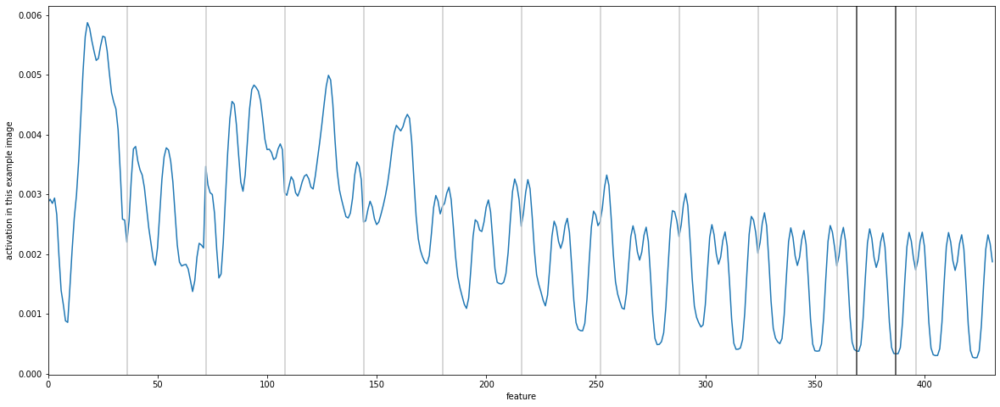

In [271]:
# find an image w LOW 45 and 135 energy in the RF region
feat_z = scipy.stats.zscore(features, axis=1)
ori1 = int(45/5)
ori2 = int(135/5)
sf2use = 10
ind1 = np.where(np.logical_and(sf_tuning_masks[sf2use], ori_tuning_masks[ori1]))[0][0]
ind2 = np.where(np.logical_and(sf_tuning_masks[sf2use], ori_tuning_masks[ori2]))[0][0]
print([ind1,ind2])

best_ind1 = np.argsort(feat_z[:,ind1])[0:50]
best_ind2 = best_ind1[np.argsort(feat_z[best_ind1,ind2])]
# best_ind1 = np.argsort(-feat_z[:,ind1])[0:50]
# best_ind2 = best_ind1[np.argsort(-feat_z[best_ind1,ind2])]
print(best_ind1)
print(best_ind2)

im2use = best_ind2[0]

plt.figure(figsize=(20,8));

image_feats = features[im2use,:]

plt.plot(np.transpose(image_feats))
# plt.plot(weights_from_val*np.sqrt(vfeat)+mfeat)
for ii in np.arange(0,432,36):
    plt.axvline(ii,color=[0.8, 0.8, 0.8])
    
plt.axvline(ind1,color=[0.2, 0.2, 0.2])
plt.axvline(ind2,color=[0.2, 0.2, 0.2])

plt.xlim([0,432])
plt.xlabel('feature')
plt.ylabel('activation in this example image')

In [265]:
region2plot_adj

array([8.03571429, 9.96428571])

[0.032070737, 3.1586567e-06]


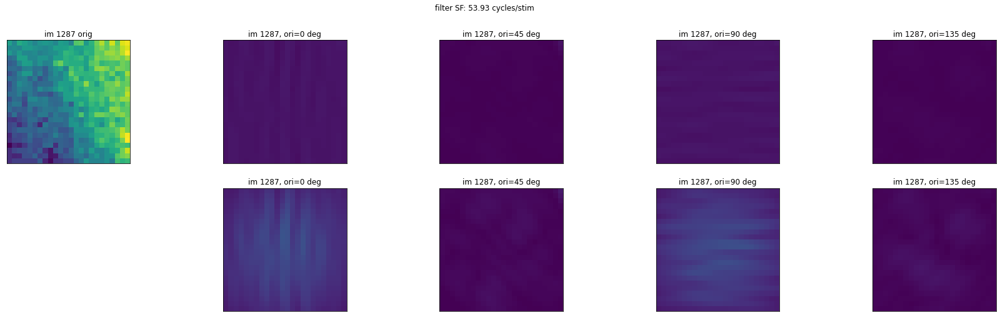

In [280]:
# visualize the actual feature maps

# zooming in on this little patch of background to see why higher for 0 and 90 channels...
region2plot = np.array([100,124])
# region2plot = np.array([0,224])

maps = _fmaps_fn(_to_torch(images[[im2use],:,:,:],device=device))
maps = [maps[sf].detach().cpu().numpy() for sf in range(len(maps))]

sf = 10
ori2plot = [0,9,18,27]

region2plot_adj = region2plot*np.shape(maps[sf])[2]/224

g = make_gaussian_mass_stack([x], [y], [sigma], n_pix=np.shape(maps[sf])[2], size=1.0, dtype=np.float32)
prf = g[2][0]

plt.figure(figsize=(30,8));
ymax=0
ymax2=0
ymaxplot = 0.033
ymaxplot2 = 1e-5

pi=pi+1
plt.subplot(2, len(ori2plot)+1, 1);
im2plot=images[im2use,0,region2plot[0]:region2plot[1],:]
plt.pcolormesh(im2plot[:,region2plot[0]:region2plot[1]])
# plt.imshow(im2plot[:,region2plot[0]:region2plot[1]])
plt.axis('square')
plt.gca().invert_yaxis()
# plt.xlim(region2plot);plt.ylim(region2plot)
plt.xticks([]); plt.yticks([])
plt.title('im %d orig'%(im2use))

pi=1
pi2=pi+len(ori2plot)+1

for oo, ori in enumerate(ori2plot):
    
    pi=pi+1
    plt.subplot(2, len(ori2plot)+1,pi);
    thismap=maps[sf][0,ori,:,:]
    assert(np.max(thismap)<ymaxplot)
    ymax = max(ymax, np.max(thismap))
    plt.pcolormesh(thismap)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.xticks([]); plt.yticks([])
    plt.xlim(region2plot_adj);plt.ylim(region2plot_adj)
    plt.title('im %d, ori=%d deg'%(im2use, orients_deg[ori]))
    plt.clim([0,ymaxplot])
    
    
    pi2=pi2+1
    plt.subplot(2, len(ori2plot)+1,pi2);

    thismap = thismap * prf
    assert(np.max(thismap)<ymaxplot2)
    ymax2 = max(ymax2, np.max(thismap))
    plt.pcolormesh(thismap)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.xticks([]); plt.yticks([])
    plt.xlim(region2plot_adj);plt.ylim(region2plot_adj)
    plt.title('im %d, ori=%d deg'%(im2use, orients_deg[ori]))
    plt.clim([0,ymaxplot2])
    
    
    
#         plt.colorbar()
plt.suptitle('filter SF: %.2f cycles/stim'%cyc_per_stim[sf])

print([ymax,ymax2])


In [281]:
_gaborizer

Gaborizer()

0.07221935


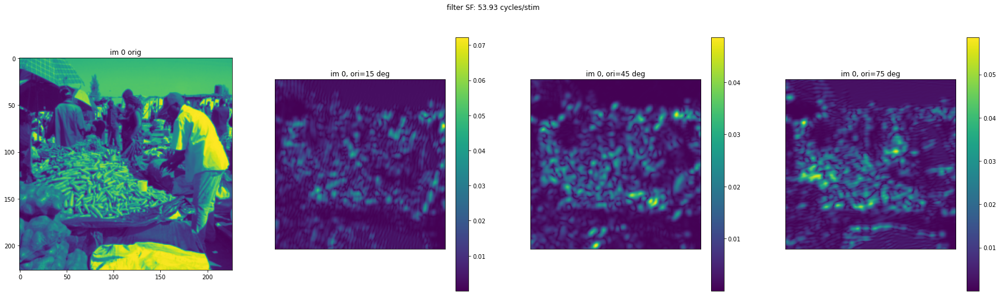

In [7]:
ims2plot=range(1)
maps = _fmaps_fn(_to_torch(images[ims2plot],device=device))
maps = [maps[sf].detach().cpu().numpy() for sf in range(len(maps))]

sf = 10
# ori2plot = [8,9,10,26,27,28]
ori2plot = [3,9,15]
# ori2plot = np.arange(6,13,1)
plt.figure(figsize=(30,8));
pi=0
ymax=0

for ii, im in enumerate(ims2plot):
    pi=pi+1
    plt.subplot(1, len(ori2plot)+1, pi);
    plt.imshow(images[im,0,:,:])
#     plt.xticks([]); plt.yticks([])
    plt.title('im %d orig'%(im))
    
for oo, ori in enumerate(ori2plot):
    for ii, im in enumerate(ims2plot):
        pi=pi+1
        plt.subplot(1, len(ori2plot)+1,pi);
        thismap=maps[sf][ii,ori,:,:]
        assert(np.max(thismap)<0.25)
        ymax = max(ymax, np.max(thismap))
        plt.imshow(thismap)
        plt.xticks([]); plt.yticks([])
        plt.title('im %d, ori=%d deg'%(im, orients_deg[ori]))
#         plt.clim([0,0.25])
        plt.colorbar()
plt.suptitle('filter SF: %.2f cycles/stim'%cyc_per_stim[sf])

print(ymax)

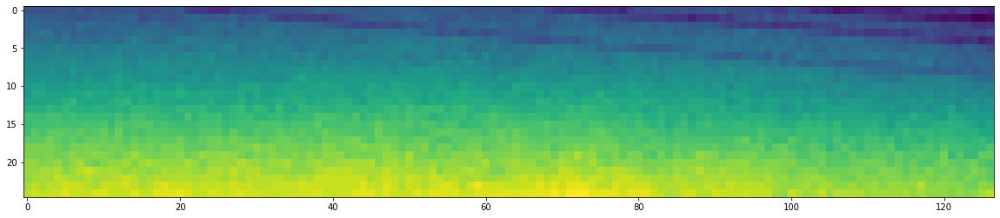

In [8]:
plt.figure(figsize=(20,20));
plt.imshow(images[im,0,0:25,100:])
# plt.colorbar()


Text(0.5, 1.0, 'im 0, ori=15 deg')

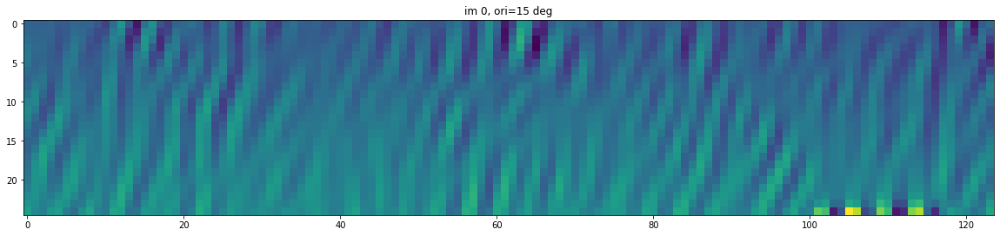

In [9]:
plt.figure(figsize=(20,20));
ori=3
thismap=maps[sf][ii,ori,:,:]
plt.imshow(thismap[0:25,100:])
plt.title('im %d, ori=%d deg'%(im, orients_deg[ori]))
# plt.clim([0,0.25])

Text(0.5, 1.0, 'im 0, ori=45 deg')

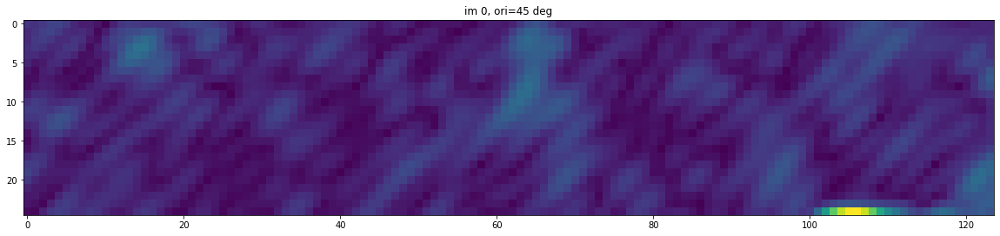

In [10]:
plt.figure(figsize=(20,20));
ori=9
thismap=maps[sf][ii,ori,:,:]
plt.imshow(thismap[0:25,100:])
plt.title('im %d, ori=%d deg'%(im, orients_deg[ori]))
# plt.clim([0,0.25])

Text(0.5, 1.0, 'im 0, ori=90 deg')

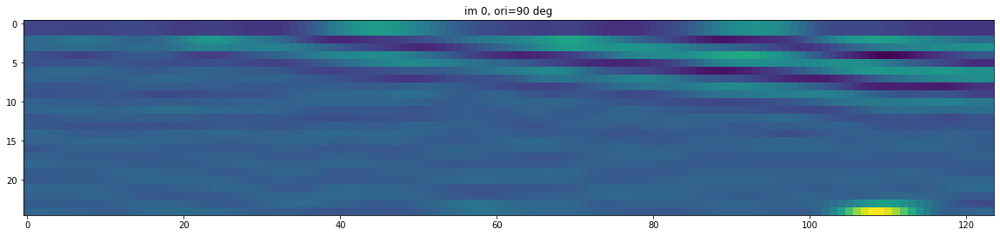

In [11]:
plt.figure(figsize=(20,20));
ori=18
thismap=maps[sf][ii,ori,:,:]
plt.imshow(thismap[0:25,100:])
plt.title('im %d, ori=%d deg'%(im, orients_deg[ori]))
# plt.clim([0,0.25])

Text(0.5, 1.0, 'im 0, ori=135 deg')

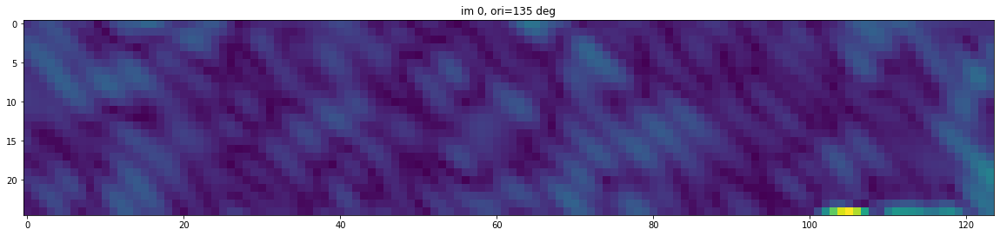

In [12]:
plt.figure(figsize=(20,20));
ori=27
thismap=maps[sf][ii,ori,:,:]
plt.imshow(thismap[0:25,100:])
plt.title('im %d, ori=%d deg'%(im, orients_deg[ori]))
# plt.clim([0,0.25])

Text(0, 0.5, 'images')

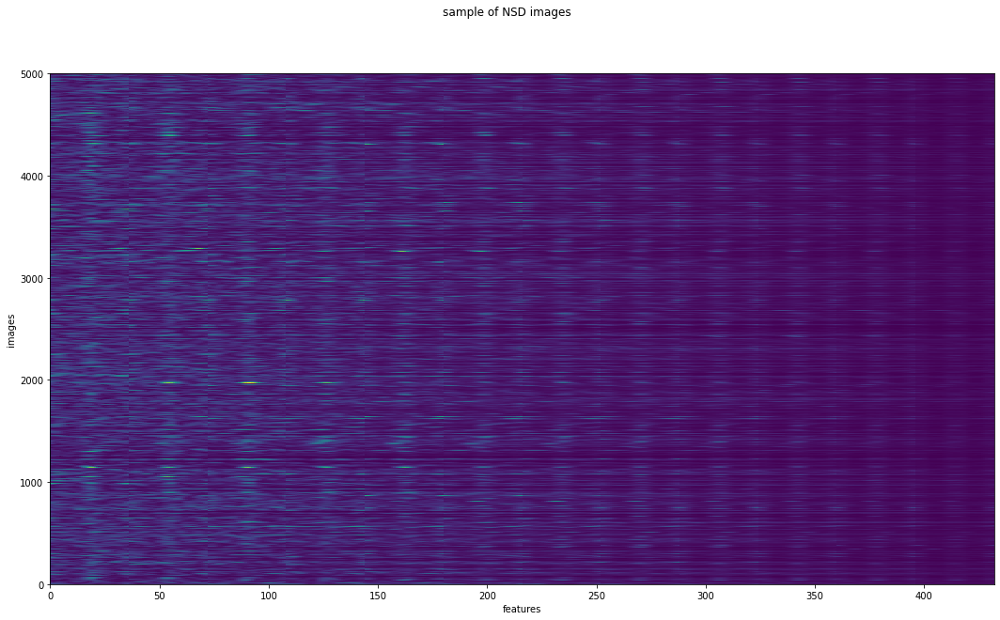

In [13]:
# visualizing ntrials x nfeatures (no z-score)

plt.figure(figsize=(18,10));
trn_features_actual = features
plt.pcolormesh(trn_features_actual)
plt.suptitle('sample of NSD images')
plt.xlabel('features')
plt.ylabel('images')

Text(0.5, 0.98, 'sample of NSD images')

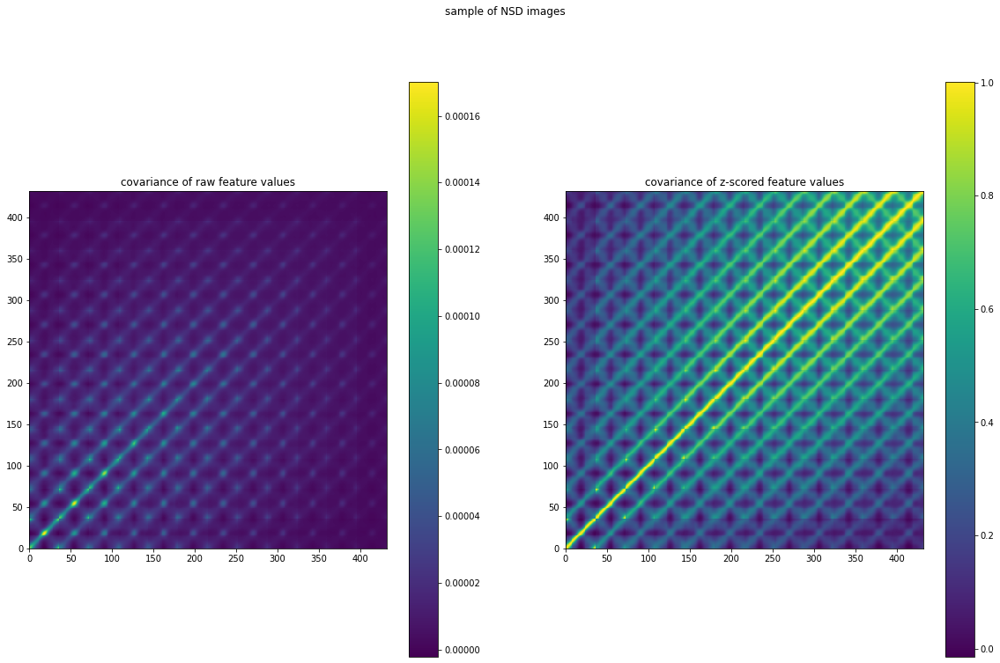

In [14]:
# visualizing covariance among features in the training set data - before and after z-scoring
# all features are nori*nsf = 432 total
import scipy
plt.figure(figsize=(20,12));

plt.subplot(1,2,1)

trn_features_actual = features
covariance_trn = np.cov(np.transpose(trn_features_actual))
plt.pcolormesh(covariance_trn)
plt.colorbar()
plt.axis('square')
plt.title('covariance of raw feature values')

plt.subplot(1,2,2)

trn_features_actual = scipy.stats.zscore(features,axis=0)
covariance_trn = np.cov(np.transpose(trn_features_actual))
plt.pcolormesh(covariance_trn)
plt.colorbar()
plt.axis('square')
plt.title('covariance of z-scored feature values')

# plt.xticks(np.arange(0,35,9),labels=np.arange(0,179,45))
# plt.yticks(np.arange(0,35,9),labels=np.arange(0,179,45))

plt.suptitle('sample of NSD images')

Text(0.5, 0.98, 'sample of NSD images\ncovariance of raw feature values')

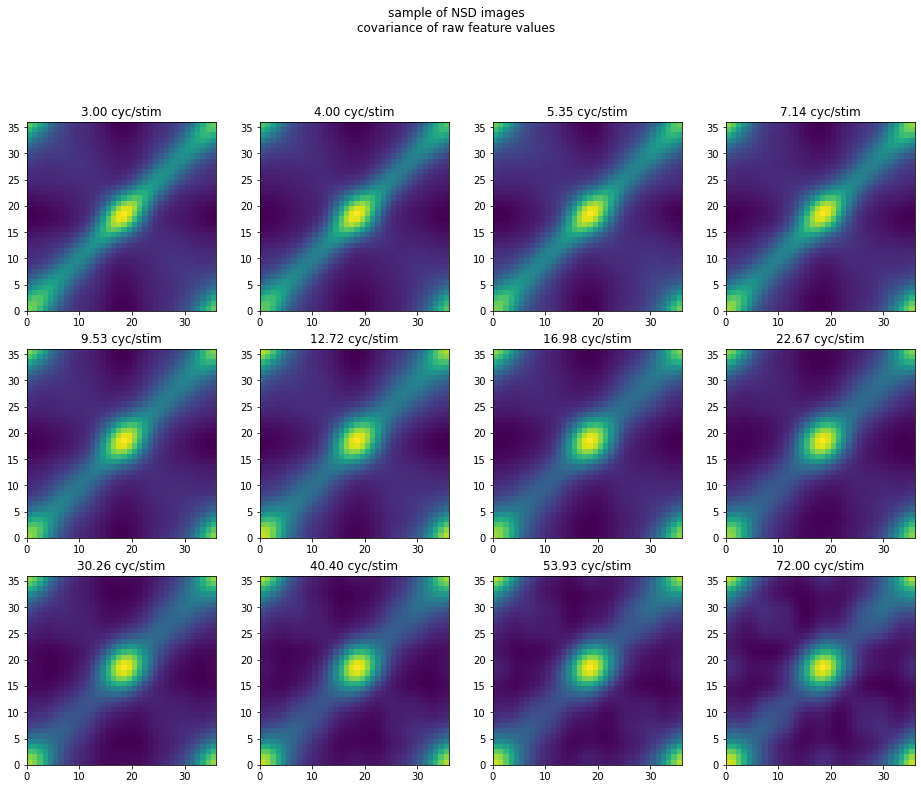

In [12]:
# visualizing just one SF at a time...

# trn_features_actual = scipy.stats.zscore(features)
trn_features_actual = features
plt.figure(figsize=(16,16));
# plotting one sf at a time to see within-sf orientation covariance...
for sf2plot in range(n_sf):

    covariance_trn = np.cov(np.transpose(trn_features_actual[:,sf_tuning_masks[sf2plot]]))
    plt.subplot(4,4,sf2plot+1)
    plt.pcolormesh(covariance_trn)
#     plt.colorbar()
    plt.axis('square')
#     plt.xticks(np.arange(0,35,9),labels=np.arange(0,179,45))
#     plt.yticks(np.arange(0,35,9),labels=np.arange(0,179,45))
    plt.title('%.2f cyc/stim'%(cyc_per_stim[sf2plot]))
    
plt.suptitle('sample of NSD images\ncovariance of raw feature values')